# IMPORTS

In [1]:
import sys, os

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# PATHS

In [2]:
from pathlib import Path

path_data = '/home/lemasle/PROJECTS/UCI_electricity_consumption/data/UC_Irvine_ML_repository/'
path_src = Path('./src')
sys.path.append(os.path.abspath(path_src))
path_figs = Path('./figs')
path_models = Path('./models')

# MY IMPORTS

In [3]:
import files_io
import cleaning
import chunk_features
import ts_clustering
import knowledge_graphs

In [4]:
tex_fonts = {"text.usetex": True,
             "font.family": 'serif',
             "axes.titlesize": 20,
             "axes.labelsize": 12,
             "font.size": 12,
             "legend.fontsize": 9.5, #xx-small',
             "legend.title_fontsize": 9.5,
             "xtick.labelsize": 9.5, #'xx-small'
             "ytick.labelsize": 9.5, #'xx-small'
             }
plt.rcParams.update(tex_fonts)
plt.rcParams['text.latex.preamble'] = r'\usepackage{amsmath,amssymb,underscore}'


cm = 1/2.54

# PREPARE INPUT DATA

In [5]:
files_io.extract_zip(path_data, 'individual+household+electric+power+consumption.zip')
data = files_io.import_data_UCI(path_data, 'household_power_consumption.txt')
list_col = ['Global_active_power', 'Global_reactive_power', 'Voltage', 'Global_intensity', \
            'Sub_metering_1', 'Sub_metering_2', 'Sub_metering_3']
data = cleaning.linear_interpolate_nans(data, list_col)
list_years = [2010]
n_items = 15
chunks = chunk_features.prepare_input_chunks(data, list_years, n_items)
files_io.save_h5_file(chunks, 'chunks2010_noshift', path_data, 'UCI_15min_chunks_2010_noshift.h5')

The selected data consists of 31668 chunks.


In [6]:
chunks.tail()

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3,chunk_index
475018,0.946,0.0,240.43,4.0,0.0,0.0,0.0,31667
475019,0.944,0.0,240.00,4.0,0.0,0.0,0.0,31667
475020,0.938,0.0,239.82,3.8,0.0,0.0,0.0,31668
475021,0.934,0.0,239.70,3.8,0.0,0.0,0.0,31668
475022,0.932,0.0,239.55,3.8,0.0,0.0,0.0,31668


In [7]:
# remove last chunk with less than 15 elements
chunks = chunks.loc[chunks.chunk_index < 31668]
# initialize values
n_samples = 31667
n_clust = 60
seed=3

# CLUSTERING MODEL

### Load the clustering model. It was trained on a random sample of 3000 chunks (see the corresponding notebook)

In [8]:
model = ts_clustering.load_model_hdf5(path_models, 'ts_clustering_60.hdf5')

### Classify the entire sample of consecutive 15-min chunks

In [9]:
X_scaled, chunks_id = ts_clustering.prepare_input_data(chunks, 'Global_active_power', n_samples, seed = seed)

In [10]:
y, clusters = ts_clustering.timeseries_clustering(X_scaled, n_clust, verbose=False, seed=seed, \
                                                  path=path_models, filename='ts_clustering_60_full_sample.hdf5', save_model=False)

# KNOWLEDGE GRAPHS

### Prepare a directed knowledge graph in a spring layout

In [11]:
KG = knowledge_graphs.get_values_for_knowledge_graph(clusters)

In [12]:
result = knowledge_graphs.get_weighted_values_for_knowledge_graph_from_pandas(KG)

In [13]:
result

,0,1,2,3,4,5,6,7,8,9,...,50,51,52,53,54,55,56,57,58,59
0,0.000000,2.824859,2.824859,4.519774,2.259887,1.694915,2.259887,0.000000,0.000000,0.564972,...,0.000000,2.824859,0.000000,1.694915,1.694915,0.000000,3.954802,0.564972,1.694915,0.564972
1,0.588235,2.773109,3.361345,2.521008,2.436975,1.764706,1.512605,2.689076,0.504202,1.680672,...,0.588235,2.184874,1.092437,0.336134,1.092437,1.260504,2.521008,0.840336,1.092437,1.680672
2,0.539957,4.319654,2.807775,2.375810,1.403888,1.619870,1.187905,2.483801,0.431965,1.727862,...,0.647948,2.375810,0.971922,0.647948,0.647948,1.187905,3.131749,0.755940,1.079914,1.295896
3,0.361882,4.342581,3.377563,3.256936,1.206273,1.085645,2.171291,3.256936,0.965018,2.412545,...,0.603136,2.774427,0.723764,1.206273,0.965018,1.206273,2.533172,0.965018,1.085645,1.206273
4,0.197628,4.150198,4.940711,2.766798,1.383399,2.569170,1.976285,1.581028,0.592885,1.778656,...,0.988142,2.569170,1.185771,0.790514,0.592885,0.592885,1.185771,0.395257,2.173913,2.173913
5,0.804829,5.030181,4.225352,2.615694,1.006036,1.810865,1.609658,2.213280,0.804829,2.012072,...,0.603622,2.012072,1.207243,1.207243,0.402414,0.804829,3.621730,1.207243,1.006036,1.408451
6,0.212766,4.468085,3.617021,1.702128,1.276596,1.063830,2.127660,3.404255,0.851064,2.127660,...,0.425532,2.978723,2.127660,0.425532,0.425532,0.851064,3.404255,0.851064,2.127660,1.063830
7,0.857843,4.044118,4.044118,2.818627,1.348039,2.328431,0.857843,2.818627,1.348039,2.450980,...,0.245098,1.593137,0.612745,0.857843,0.490196,1.225490,2.941176,0.367647,1.593137,0.857843
8,0.854701,5.128205,2.136752,5.982906,1.709402,0.427350,1.709402,6.410256,0.427350,1.709402,...,0.000000,2.991453,1.709402,0.854701,0.000000,1.709402,1.282051,0.000000,0.854701,1.709402
9,0.732064,3.367496,3.367496,3.367496,1.317716,0.585652,1.464129,1.903367,0.878477,2.635432,...,0.439239,2.196193,0.878477,0.732064,0.585652,0.439239,2.635432,1.171303,1.610542,1.464129


### Display the knowledge graph

In [14]:
G, pos = knowledge_graphs.get_spring_layout_from_pandas_adjacency(result, 42, 0.8, graph_type='directed')

Directed graph


#### Only limited information can be drawn from the graph below. It displays all possible connections, but without taking into account their probability. We investigate the properties of this knowledge graph before showing a more refined setup below.

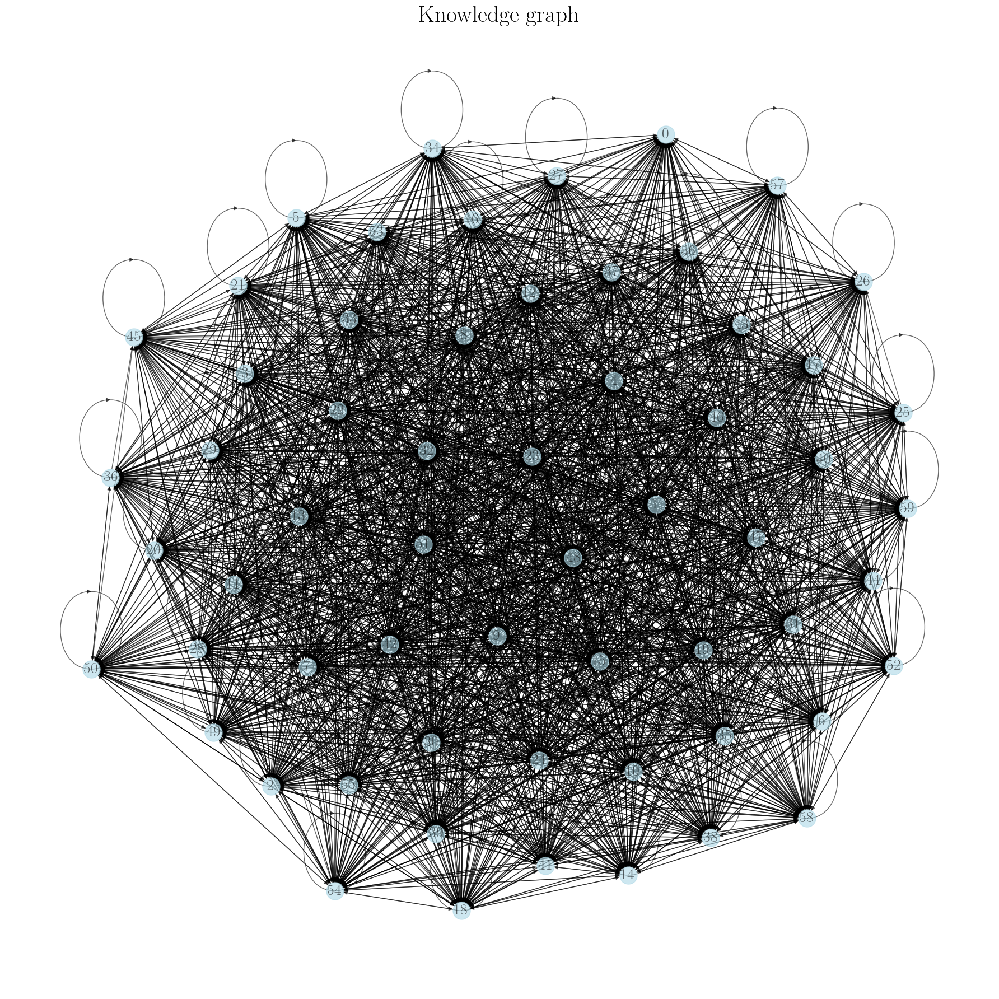

In [15]:
knowledge_graphs.plot_knowledge_graph(G, pos, path_figs, 'UCI_15min_chunks_60clusters_KnowledgeGraph.pdf', cm)

### Some useful (global) quantities about the graph

In [16]:
#print(f'Nodes: {G.nodes}')
print(f'Number of nodes: {G.number_of_nodes()}')
print(f'Number of edges: {G.number_of_edges()}')
print(f'Ratio edges to nodes: {round(G.number_of_edges() / G.number_of_nodes(), 2)}')

Number of nodes: 60
Number of edges: 3482
Ratio edges to nodes: 58.03


### Properties of individual nodes/edges

In [17]:
KG_prop = knowledge_graphs.get_nodes_properties(G)
KG_prop.head()

,cluster,degree,betweenness,closeness,edges_in,edges_out
0,0,1.745763,0.000290,0.893939,52,51
1,1,2.033898,0.000668,1.000000,60,60
2,2,2.033898,0.000668,1.000000,60,60
3,3,2.033898,0.000668,1.000000,60,60
4,4,2.016949,0.000633,1.000000,60,59


#### "Degree centrality" counts the number of edges arriving on a node. Nodes with higher degree of centrality are more connected. The following plots indicate that all nodes are roughly equally connected

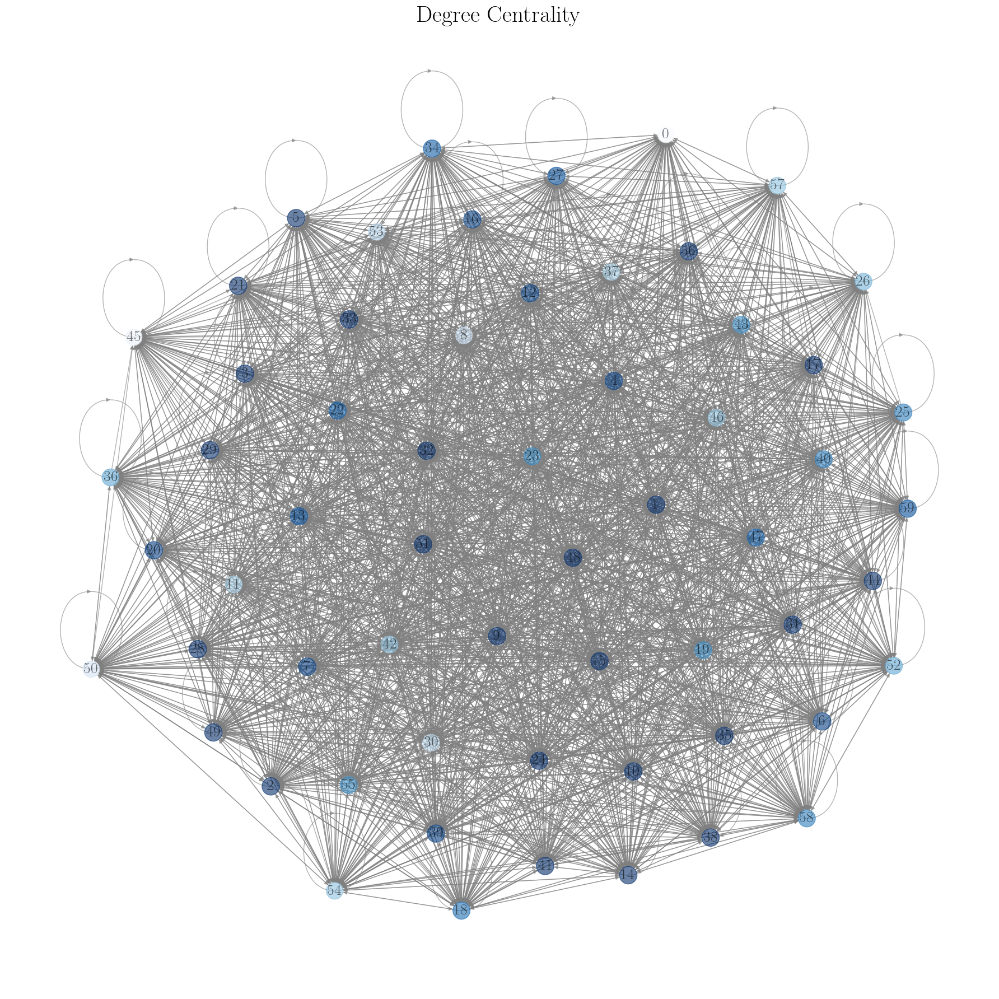

In [18]:
knowledge_graphs.plot_centrality(G, pos, path_figs, 'UCI_15min_chunks_60clusters_centrality.pdf', cm)

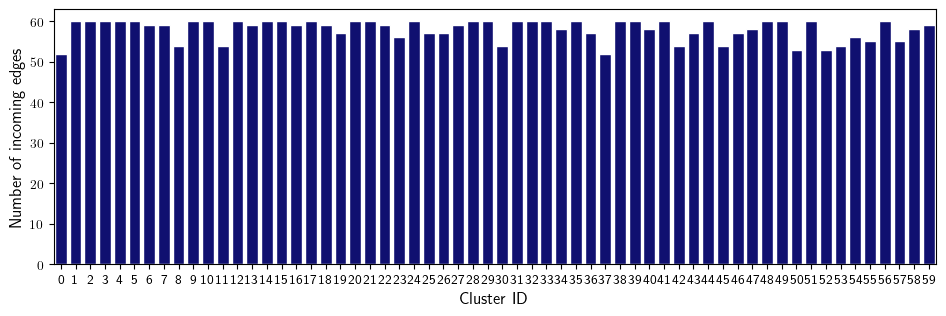

In [19]:
knowledge_graphs.plot_KG_histogram(KG_prop, 'cluster', 'edges_in', 'navy', 'Cluster ID', 'Number of incoming edges', 'Incoming_edges', \
                  path_figs, 'UCI_15min_chunks_60clusters_incoming_edges.pdf', cm)

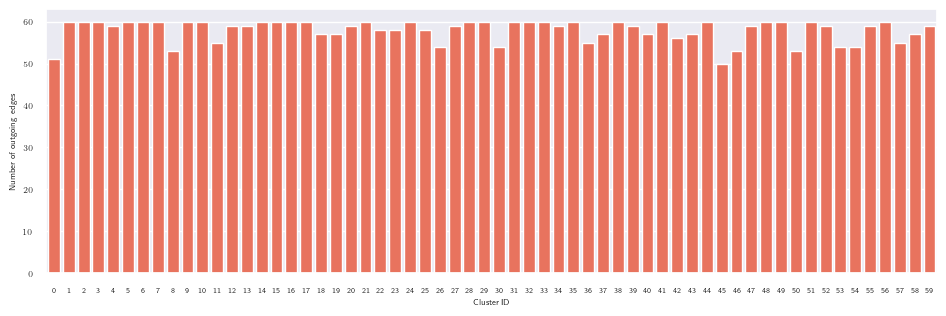

In [20]:
knowledge_graphs.plot_KG_histogram(KG_prop, 'cluster', 'edges_out', 'tomato', 'Cluster ID', 'Number of outgoing edges', 'Incoming_edges', \
                  path_figs, 'UCI_15min_chunks_60clusters_outgoing_edges.pdf', cm)

#### Both the degree centrality plot and the histograms above indicate that each node is connected to almost all of the other nodes. This means that (on average over the year 2010) any individual cluster of 15-min chunks could be followed by almost any other cluster of chunks. However, these quantities do not take into account the probability for a given connection to occur.

### Extracting other available information:

#### For the completeness, we investigate other quantities we have access to:

#### "Betweenness centrality" indicates how often a node lies on the shortest path between other nodes. Nodes with high betweenness centrality are good bridges between different parts of the graph.

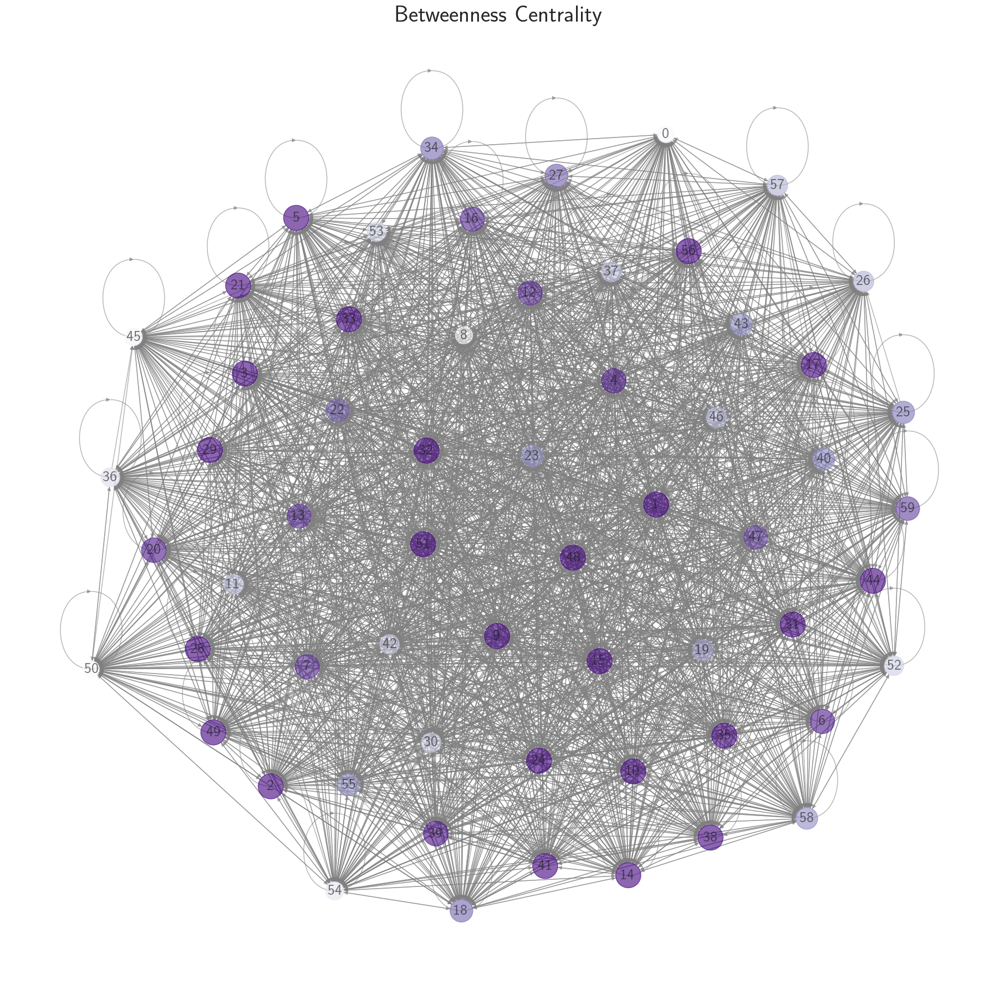

In [21]:
knowledge_graphs.plot_betweenness_centrality(G, pos, path_figs, 'UCI_15min_chunks_60clusters_betweenness_centrality.pdf', cm)

#### "Closeness centrality" indicates how quickly a given node can reach all the other nodes. Nodes with higher closeness centrality are more "central" because they reach other nodes more efficiently.

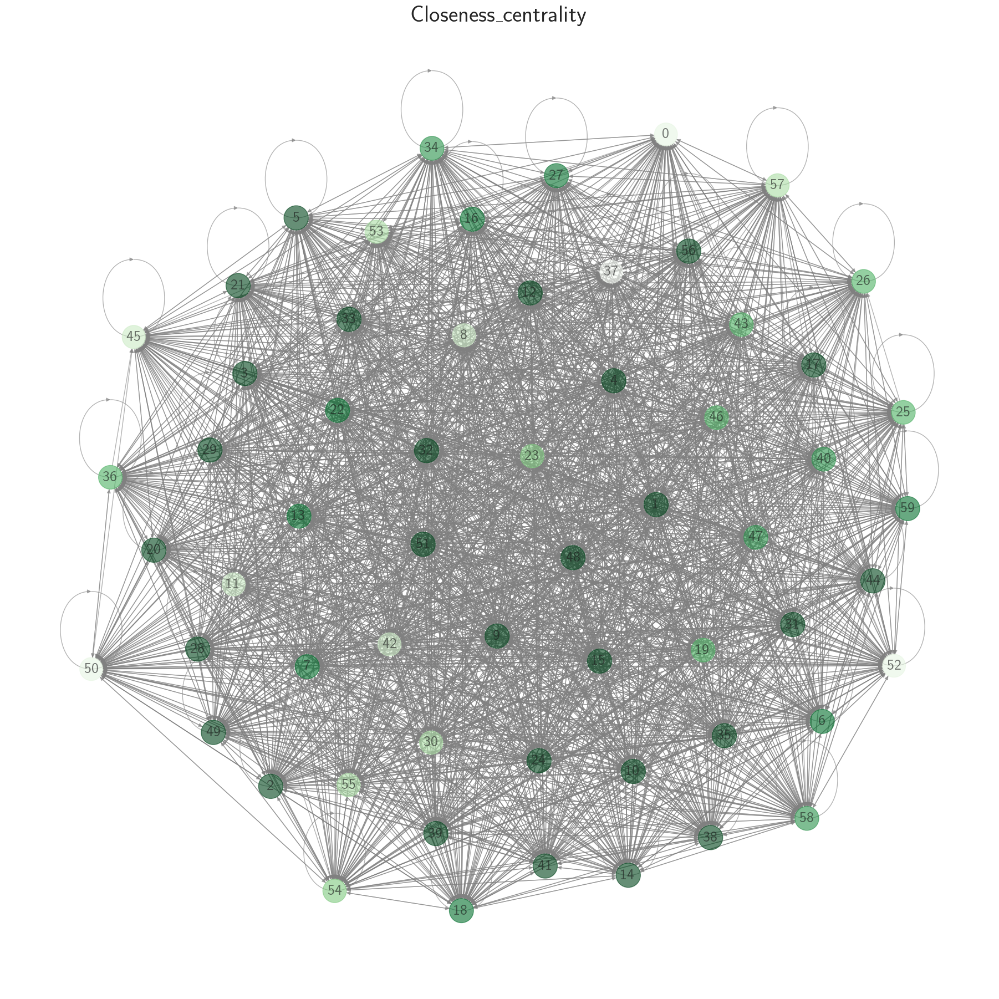

In [22]:
knowledge_graphs.plot_closeness_centrality(G, pos, path_figs, 'UCI_15min_chunks_60clusters_closeness_centrality.pdf', cm)

# KNOWLEDGE GRAPHS AND CONNECTION PROBABILITY

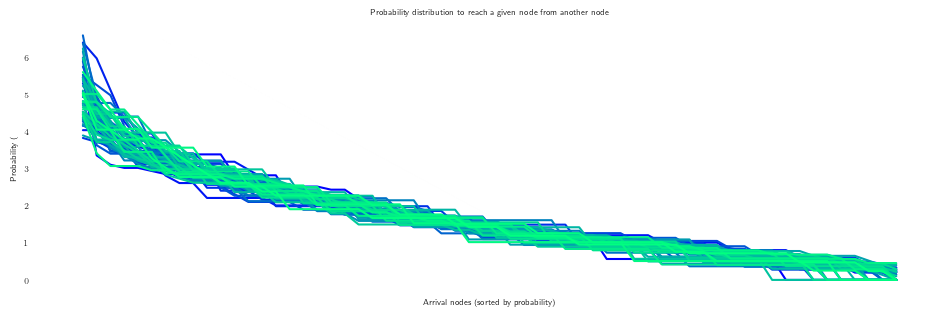

In [23]:
knowledge_graphs.plot_probability_distribution(result, list(np.arange(0, 60, 1, dtype='int64')), path_figs,\
                                               'UCI_next_cluster_probability distribution.pdf', cm)

#### The plot above shows the probability distribution to reach a given node when starting from another node (between 0 and 59). The probabilities vary according to the starting node, here we are only interested in their distribution.

#### Since we have 60 nodes (=clusters), the probability to reach a given node from a node between 0 and 59 is below 5%. However, a 5% probability is 10 times more likeky than a 0.5% probability.

#### We show only connections above a certain probability threshold (here 3%) to create a more refined version of the knowledge graph previously shown. 

In [24]:
result3 = knowledge_graphs.replace_df_elements_below_threshold(result, 3, 0)

In [25]:
G3, pos3 = knowledge_graphs.get_spring_layout_from_pandas_adjacency(result3, 42, 0.8, graph_type='directed')

Directed graph


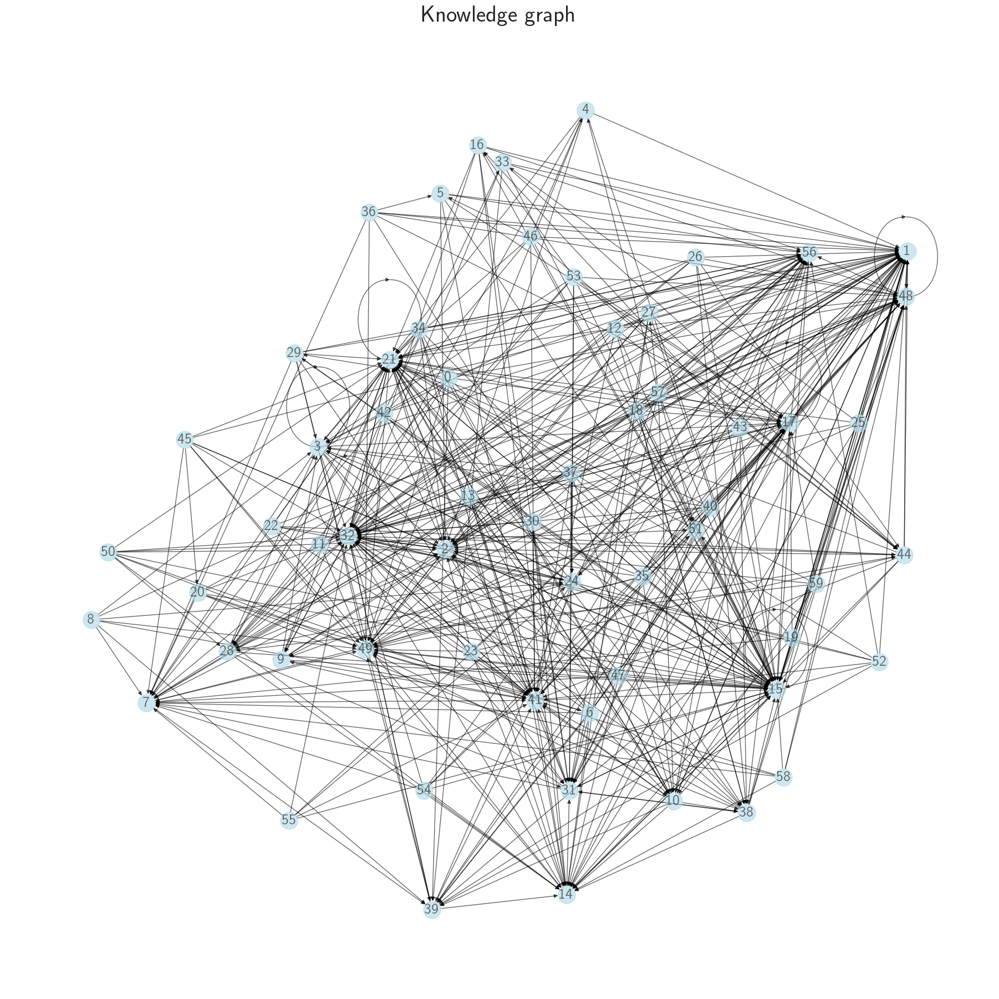

In [26]:
knowledge_graphs.plot_knowledge_graph(G3, pos3, path_figs, 'UCI_15min_chunks_60clusters_KnowledgeGraph_th=3.pdf', cm)

#### We see that some nodes are very often incoming nodes, while others are only outgoing nodes. This knowledge helps us predicting the evolution of the global active power demand within the next quarter. 

# POSSIBLE EXTENSIONS

#### Here we investigated only the relations between consecutive chunks (for instance 0:15-min followed by 15:30-min). It would be interesting to also check how overlapping chunks (for instance 0:15-min and 5:20-min)) would be connected 